#  AI Graphics | NYU 2024
### Name: Qingxin Meng

## Assignment - Part 3

This notebook includes answers to 2.5

This notebook takes a total of 440 seconds to run on a 4070ti GPU.

## 0. Install and Import modules

In [1]:
import os
import sys
import torch
need_pytorch3d=False
try:
    import pytorch3d
except ModuleNotFoundError:
    need_pytorch3d=True
if need_pytorch3d:
    if torch.__version__.startswith(("2.2.")) and sys.platform.startswith("linux"):
        # We try to install PyTorch3D via a released wheel.
        pyt_version_str=torch.__version__.split("+")[0].replace(".", "")
        version_str="".join([
            f"py3{sys.version_info.minor}_cu",
            torch.version.cuda.replace(".",""),
            f"_pyt{pyt_version_str}"
        ])
        !pip install fvcore iopath
        !pip install --no-index --no-cache-dir pytorch3d -f https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html
    else:
        # We try to install PyTorch3D from source.
        !pip install 'git+https://github.com/facebookresearch/pytorch3d.git@stable'

In [2]:
import os
import torch
from pytorch3d.io import load_obj, save_obj,load_objs_as_meshes
from pytorch3d.structures import Meshes
from pytorch3d.utils import ico_sphere,torus
from pytorch3d.ops import sample_points_from_meshes
from pytorch3d.loss import (
    chamfer_distance,
    mesh_edge_loss,
    mesh_laplacian_smoothing,
    mesh_normal_consistency,
)
from pytorch3d.transforms import RotateAxisAngle
import numpy as np
from tqdm.notebook import tqdm
%matplotlib notebook
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['savefig.dpi'] = 80
mpl.rcParams['figure.dpi'] = 80

from plotly.subplots import make_subplots
torch.manual_seed(777)

# Set the device
if torch.cuda.is_available():
    device = torch.device("cuda:0")
else:
    device = torch.device("cpu")
    print("WARNING: CPU only, this will be slow!")

## 1. Load an obj file and create a Meshes object

In [3]:
!wget -nc https://dl.fbaipublicfiles.com/pytorch3d/data/dolphin/dolphin.obj

File ‘dolphin.obj’ already there; not retrieving.



In [4]:
# Load the dolphin mesh.
trg_obj = os.path.join('dolphin.obj')

In [5]:
# We read the target 3D model using load_obj
verts, faces, aux = load_obj(trg_obj)

# verts is a FloatTensor of shape (V, 3) where V is the number of vertices in the mesh
# faces is an object which contains the following LongTensors: verts_idx, normals_idx and textures_idx
# For this tutorial, normals and textures are ignored.
faces_idx = faces.verts_idx.to(device)
verts = verts.to(device)

/home/m/miniconda3/envs/pytorch3d/lib/python3.9/site-packages/pytorch3d/io/obj_io.py:544: UserWarning: No mtl file provided
  warnings.warn("No mtl file provided")


In [6]:
# We initialize the source shape to be a sphere of radius 1
src_mesh = ico_sphere(4, device)

In [7]:
##############################################################################
# Code for 1.1
centered_verts = verts-verts.mean()
largest_distance=centered_verts.norm(dim=1).max()
normalized_verts = centered_verts/largest_distance

trg_mesh=Meshes([normalized_verts], [faces_idx])


# Code for 1.2
import plotly.graph_objects as go
import numpy as np


def plotly_submeshes(verts,faces,size):
    specs=[[{"type": "mesh3d"} for i in range(size[1])] for j in range(size[0])]
    fig = make_subplots(size[0],size[1],specs=specs)
    for j in range(size[0]):
        for i in range(size[1]):
            fig.add_trace(go.Mesh3d(x=verts[j][i][:,0],y=verts[j][i][:,1],z=verts[j][i][:,2],i=faces[j][i][:,0],j=faces[j][i][:,1],k=faces[j][i][:,2]),row=j+1,col=i+1)
    return fig


verts1=trg_mesh.verts_packed().cpu()
faces1=trg_mesh.faces_packed().cpu()
#fig1 = go.Figure(data=[go.Mesh3d(x=verts1[:,0], y=verts1[:,1], z=verts1[:,2],i=faces1[:, 0],j=faces1[:, 1],k=faces1[:, 2])])
#fig1.show()
verts5=verts.cpu()

verts2=src_mesh.verts_packed().cpu()
faces2=src_mesh.faces_packed().cpu()
#fig2 =go.Figure(data=[go.Mesh3d(x=verts2[:,0], y=verts2[:,1], z=verts2[:,2],i=faces2[:, 0],j=faces2[:, 1],k=faces2[:, 2])])
#fig2.show()

##############################################################################

###  Visualizing point clouds with Matplotlib

In [8]:
def plot_pointcloud(mesh, title=""):
    # Sample points uniformly from the surface of the mesh.
    points = sample_points_from_meshes(mesh, 5000)
    x, y, z = points.clone().detach().cpu().squeeze().unbind(1)
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter3D(x, z, -y)
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_zlabel('y')
    ax.set_title(title)
    ax.view_init(190, 30)
    plt.show()

In [9]:
def plot_losses_log(loss_dict, size=(13,5)):
  fig = plt.figure(figsize=size)
  ax = fig.gca()
  for loss_name, loss_values in loss_dict.items():
    ax.plot(loss_values, label=loss_name)
  ax.legend(fontsize="16")
  ax.set_xlabel("Iteration", fontsize="16")
  ax.set_ylabel("Loss", fontsize="16")
  ax.set_title("Loss vs iterations", fontsize="16")
  ax.set_yscale('log') 

# 2.5 Experiment with others optimizers such as `Adam` and `RMSprop` in place of `SGD`. Also, try changing the learning rate (`lr`), and `momentum` when these parameters are applied. What do you observe in terms of speed of convergence and quality of final results?




In [10]:
##############################################################################
# code for 2.5
def SGD_opt(src_mesh,trg_mesh,chamfer,edge,normal,laplacian,iterations,lr,momentum):
    # The shape of the deform parameters is equal to the total number of vertices in src_mesh
    deform_verts = torch.full(src_mesh.verts_packed().shape, 0.0, device=device, requires_grad=True)
    # The optimizer
    optimizer = torch.optim.SGD([deform_verts], lr=lr, momentum=momentum)
    # Number of optimization steps
    Niter = iterations
    # Weight for the chamfer loss
    w_chamfer = chamfer
    # Weight for mesh edge loss
    w_edge = edge
    # Weight for mesh normal consistency
    w_normal = normal
    # Weight for mesh laplacian smoothing
    w_laplacian = laplacian
    # Plot period for the losses
    plot_period = 1000
    loop = tqdm(range(Niter))

    chamfer_losses = []
    laplacian_losses = []
    edge_losses = []
    normal_losses = []
    total_losses = []
    %matplotlib inline

    for i in loop:
        # Initialize optimizer
        optimizer.zero_grad()

        # Deform the mesh
        new_src_mesh = src_mesh.offset_verts(deform_verts)

        # We sample 5k points from the surface of each mesh
        sample_trg = sample_points_from_meshes(trg_mesh, 5000)
        sample_src = sample_points_from_meshes(new_src_mesh, 5000)

        # We compare the two sets of pointclouds by computing (a) the chamfer loss
        loss_chamfer, _ = chamfer_distance(sample_trg, sample_src)

        # and (b) the edge length of the predicted mesh
        loss_edge = mesh_edge_loss(new_src_mesh)

        # mesh normal consistency
        loss_normal = mesh_normal_consistency(new_src_mesh)

        # mesh laplacian smoothing
        loss_laplacian = mesh_laplacian_smoothing(new_src_mesh, method="uniform")

        # Weighted sum of the losses
        loss = loss_chamfer * w_chamfer + loss_edge * w_edge + loss_normal * w_normal + loss_laplacian * w_laplacian

        # Print the losses
        loop.set_description('total_loss = %.6f' % loss)

        # Save the losses for plotting
        chamfer_losses.append(float(loss_chamfer.detach().cpu()))
        edge_losses.append(float(loss_edge.detach().cpu()))
        normal_losses.append(float(loss_normal.detach().cpu()))
        laplacian_losses.append(float(loss_laplacian.detach().cpu()))
        total_losses.append(float(loss.detach().cpu()))

        # Plot mesh
        if i % plot_period == 0:
            plot_pointcloud(new_src_mesh, title="iter: %d" % i)

        if i == 2000:
            for param_group in optimizer.param_groups:
                param_group['lr'] /= 2

        # Optimization step
        loss.backward()
        optimizer.step()

    final_verts, final_faces = new_src_mesh.get_mesh_verts_faces(0)
    losses = {"chamfer loss": chamfer_losses,
          "edge loss": edge_losses,
          "normal loss": normal_losses,
          "laplacian loss": laplacian_losses,
          "total loss":total_losses}

    return final_verts, final_faces,losses
    
def Adam_opt(src_mesh,trg_mesh,chamfer,edge,normal,laplacian,iterations,lr,betas):
    # The shape of the deform parameters is equal to the total number of vertices in src_mesh
    deform_verts = torch.full(src_mesh.verts_packed().shape, 0.0, device=device, requires_grad=True)
    # The optimizer
    optimizer = torch.optim.Adam([deform_verts], lr=lr, betas=betas)
    # Number of optimization steps
    Niter = iterations
    # Weight for the chamfer loss
    w_chamfer = chamfer
    # Weight for mesh edge loss
    w_edge = edge
    # Weight for mesh normal consistency
    w_normal = normal
    # Weight for mesh laplacian smoothing
    w_laplacian = laplacian
    # Plot period for the losses
    plot_period = 1000
    loop = tqdm(range(Niter))

    chamfer_losses = []
    laplacian_losses = []
    edge_losses = []
    normal_losses = []
    total_losses = []
    %matplotlib inline

    for i in loop:
        # Initialize optimizer
        optimizer.zero_grad()

        # Deform the mesh
        new_src_mesh = src_mesh.offset_verts(deform_verts)

        # We sample 5k points from the surface of each mesh
        sample_trg = sample_points_from_meshes(trg_mesh, 5000)
        sample_src = sample_points_from_meshes(new_src_mesh, 5000)

        # We compare the two sets of pointclouds by computing (a) the chamfer loss
        loss_chamfer, _ = chamfer_distance(sample_trg, sample_src)

        # and (b) the edge length of the predicted mesh
        loss_edge = mesh_edge_loss(new_src_mesh)

        # mesh normal consistency
        loss_normal = mesh_normal_consistency(new_src_mesh)

        # mesh laplacian smoothing
        loss_laplacian = mesh_laplacian_smoothing(new_src_mesh, method="uniform")

        # Weighted sum of the losses
        loss = loss_chamfer * w_chamfer + loss_edge * w_edge + loss_normal * w_normal + loss_laplacian * w_laplacian

        # Print the losses
        loop.set_description('total_loss = %.6f' % loss)

        # Save the losses for plotting
        chamfer_losses.append(float(loss_chamfer.detach().cpu()))
        edge_losses.append(float(loss_edge.detach().cpu()))
        normal_losses.append(float(loss_normal.detach().cpu()))
        laplacian_losses.append(float(loss_laplacian.detach().cpu()))
        total_losses.append(float(loss.detach().cpu()))

        # Plot mesh
        if i % plot_period == 0:
            plot_pointcloud(new_src_mesh, title="iter: %d" % i)

        if i == 2000:
            for param_group in optimizer.param_groups:
                param_group['lr'] /= 2

        # Optimization step
        loss.backward()
        optimizer.step()

    final_verts, final_faces = new_src_mesh.get_mesh_verts_faces(0)
    losses = {"chamfer loss": chamfer_losses,
          "edge loss": edge_losses,
          "normal loss": normal_losses,
          "laplacian loss": laplacian_losses,
          "total loss":total_losses}

    return final_verts, final_faces,losses

def RMSprop_opt(src_mesh,trg_mesh,chamfer,edge,normal,laplacian,iterations,lr,momentum):
    # The shape of the deform parameters is equal to the total number of vertices in src_mesh
    deform_verts = torch.full(src_mesh.verts_packed().shape, 0.0, device=device, requires_grad=True)
    # The optimizer
    optimizer = torch.optim.RMSprop([deform_verts], lr=lr, momentum=momentum)
    # Number of optimization steps
    Niter = iterations
    # Weight for the chamfer loss
    w_chamfer = chamfer
    # Weight for mesh edge loss
    w_edge = edge
    # Weight for mesh normal consistency
    w_normal = normal
    # Weight for mesh laplacian smoothing
    w_laplacian = laplacian
    # Plot period for the losses
    plot_period = 1000
    loop = tqdm(range(Niter))

    chamfer_losses = []
    laplacian_losses = []
    edge_losses = []
    normal_losses = []
    total_losses = []
    %matplotlib inline

    for i in loop:
        # Initialize optimizer
        optimizer.zero_grad()

        # Deform the mesh
        new_src_mesh = src_mesh.offset_verts(deform_verts)

        # We sample 5k points from the surface of each mesh
        sample_trg = sample_points_from_meshes(trg_mesh, 5000)
        sample_src = sample_points_from_meshes(new_src_mesh, 5000)

        # We compare the two sets of pointclouds by computing (a) the chamfer loss
        loss_chamfer, _ = chamfer_distance(sample_trg, sample_src)

        # and (b) the edge length of the predicted mesh
        loss_edge = mesh_edge_loss(new_src_mesh)

        # mesh normal consistency
        loss_normal = mesh_normal_consistency(new_src_mesh)

        # mesh laplacian smoothing
        loss_laplacian = mesh_laplacian_smoothing(new_src_mesh, method="uniform")

        # Weighted sum of the losses
        loss = loss_chamfer * w_chamfer + loss_edge * w_edge + loss_normal * w_normal + loss_laplacian * w_laplacian

        # Print the losses
        loop.set_description('total_loss = %.6f' % loss)

        # Save the losses for plotting
        chamfer_losses.append(float(loss_chamfer.detach().cpu()))
        edge_losses.append(float(loss_edge.detach().cpu()))
        normal_losses.append(float(loss_normal.detach().cpu()))
        laplacian_losses.append(float(loss_laplacian.detach().cpu()))
        total_losses.append(float(loss.detach().cpu()))

        # Plot mesh
        if i % plot_period == 0:
            plot_pointcloud(new_src_mesh, title="iter: %d" % i)

        if i == 2000:
            for param_group in optimizer.param_groups:
                param_group['lr'] /= 2

        # Optimization step
        loss.backward()
        optimizer.step()
    losses = {"chamfer loss": chamfer_losses,
          "edge loss": edge_losses,
          "normal loss": normal_losses,
          "laplacian loss": laplacian_losses,
          "total loss":total_losses}
    final_verts, final_faces = new_src_mesh.get_mesh_verts_faces(0)
    return final_verts, final_faces,losses
##############################################################################

  0%|          | 0/2000 [00:00<?, ?it/s]

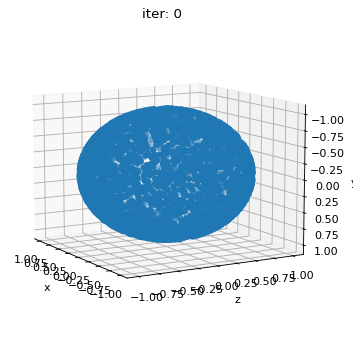

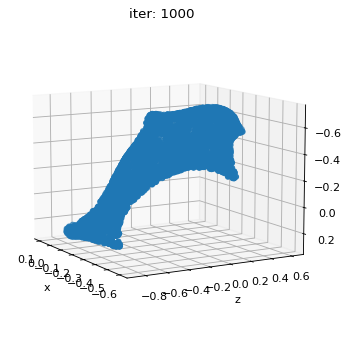

  0%|          | 0/2000 [00:00<?, ?it/s]

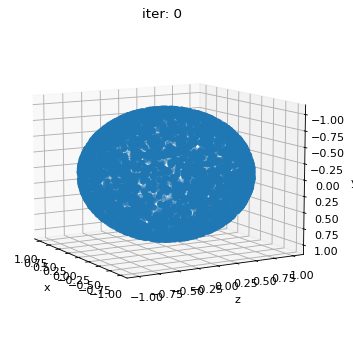

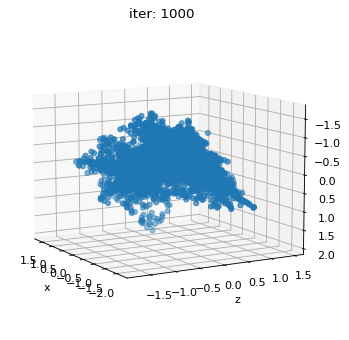

  0%|          | 0/2000 [00:00<?, ?it/s]

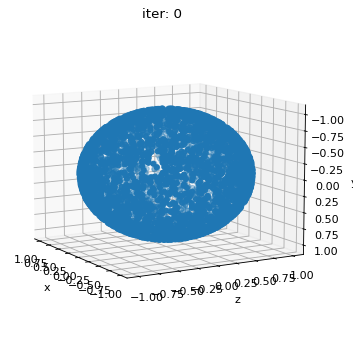

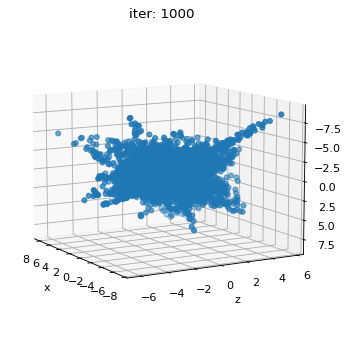

In [11]:
# code for 2.5 part 1 (normal config)
final_verts, final_faces,losses1=SGD_opt(src_mesh,trg_mesh,1.0,1.0,0.01,0.1,2000,1.0,0.9)
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts18 = final_verts_nback.detach().cpu()
faces18 = final_faces.cpu()

final_verts, final_faces,losses2=Adam_opt(src_mesh,trg_mesh,1.0,1.0,0.01,0.1,2000,1.0,(0.9,0.999))
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts19 = final_verts_nback.detach().cpu()
faces19 = final_faces.cpu()

final_verts, final_faces,losses3=RMSprop_opt(src_mesh,trg_mesh,1.0,1.0,0.01,0.1,2000,1.0,0.9)
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts20 = final_verts_nback.detach().cpu()
faces20 = final_faces.cpu()

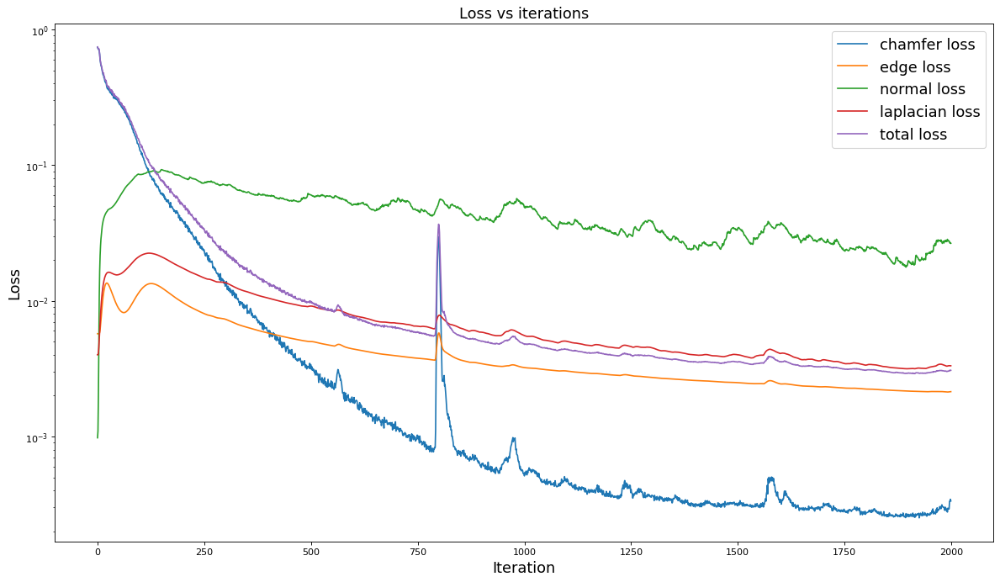

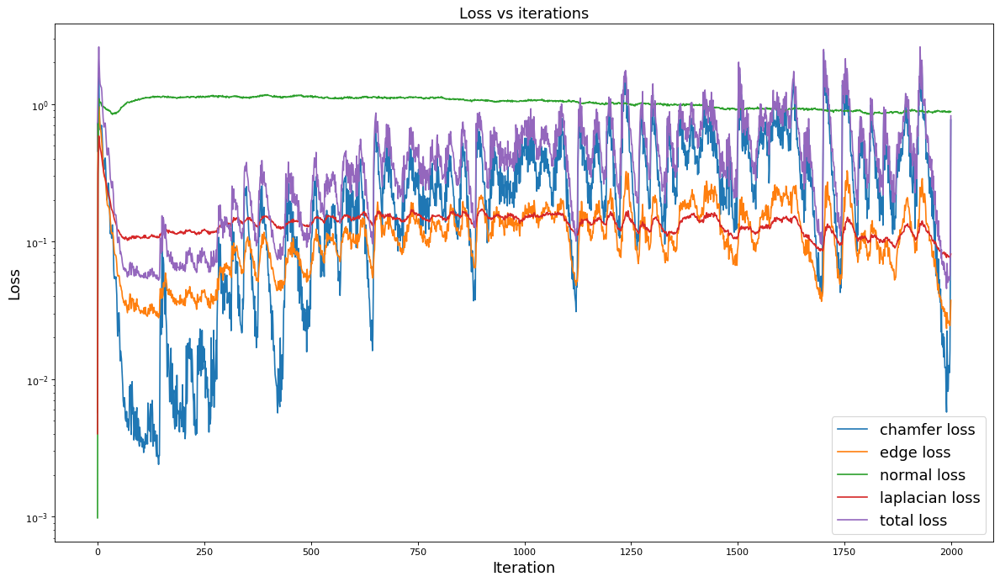

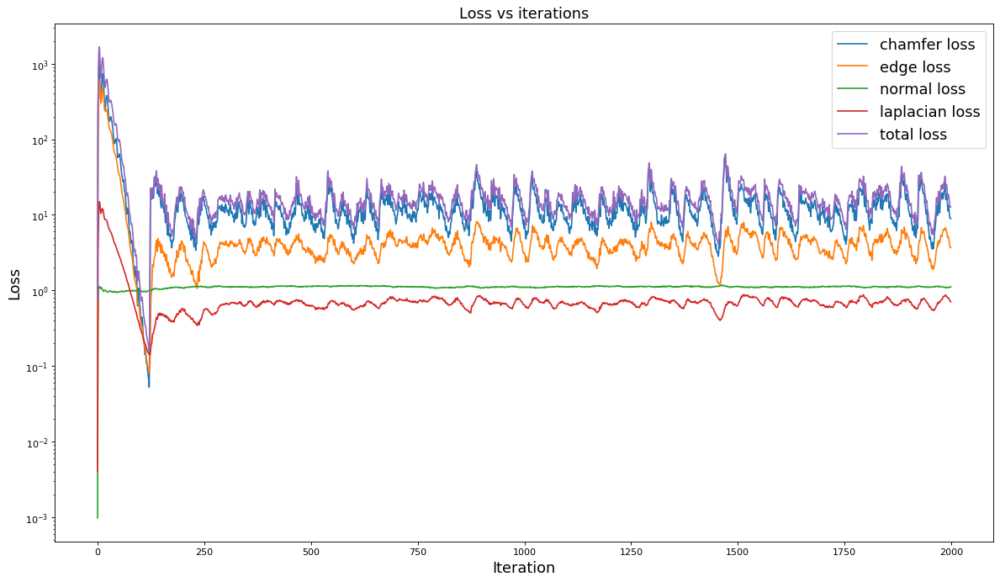

In [12]:
plot_losses_log(losses1,(18,10))
plot_losses_log(losses2,(18,10))
plot_losses_log(losses3,(18,10))

In [13]:
plotly_submeshes([[verts18,verts19,verts20]],[[faces18,faces19,faces20]],(1,3))

## Discussion for 2.5 part 1 (normal config)

The first loss figure and the first mesh represent the result from SGD, the second pair represent the result from Adam, and the third pair represent the result from RMSprop. 

The learning rate of 1.0 seems to be effective only for SGD method, while the Adam and the RMSprop method cannot reconstruct mesh in such configuration.

  0%|          | 0/2000 [00:00<?, ?it/s]

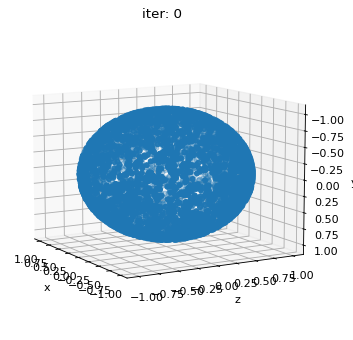

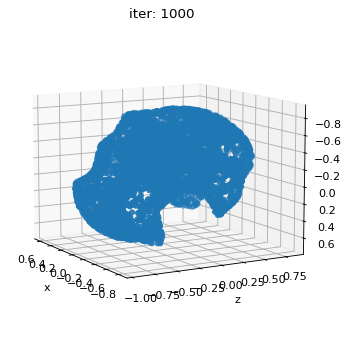

  0%|          | 0/2000 [00:00<?, ?it/s]

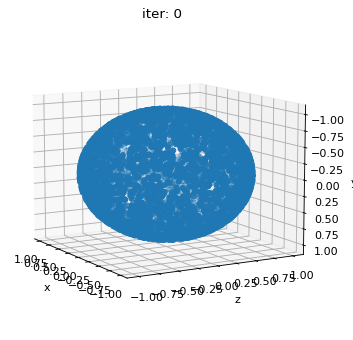

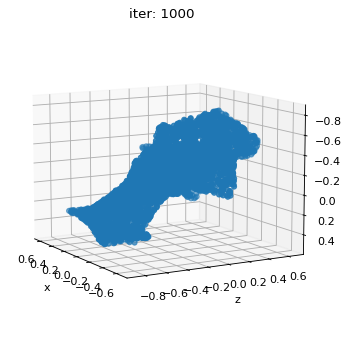

  0%|          | 0/2000 [00:00<?, ?it/s]

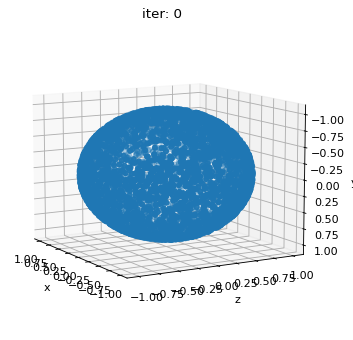

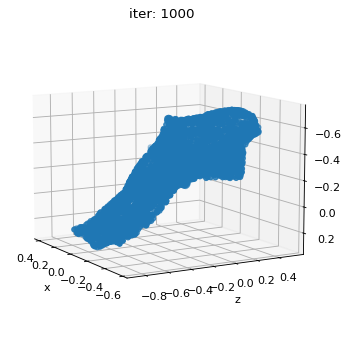

In [14]:
# code for 2.5 part 2 (learning rate)
final_verts, final_faces,losses4=SGD_opt(src_mesh,trg_mesh,1.0,1.0,0.01,0.1,2000,0.1,0.9)
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts21 = final_verts_nback.detach().cpu()
faces21 = final_faces.cpu()

final_verts, final_faces,losses5=Adam_opt(src_mesh,trg_mesh,1.0,1.0,0.01,0.1,2000,0.001,(0.9,0.999))
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts22 = final_verts_nback.detach().cpu()
faces22 = final_faces.cpu()

final_verts, final_faces,losses6=RMSprop_opt(src_mesh,trg_mesh,1.0,1.0,0.01,0.1,2000,0.0001,0.9)
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts23 = final_verts_nback.detach().cpu()
faces23 = final_faces.cpu()

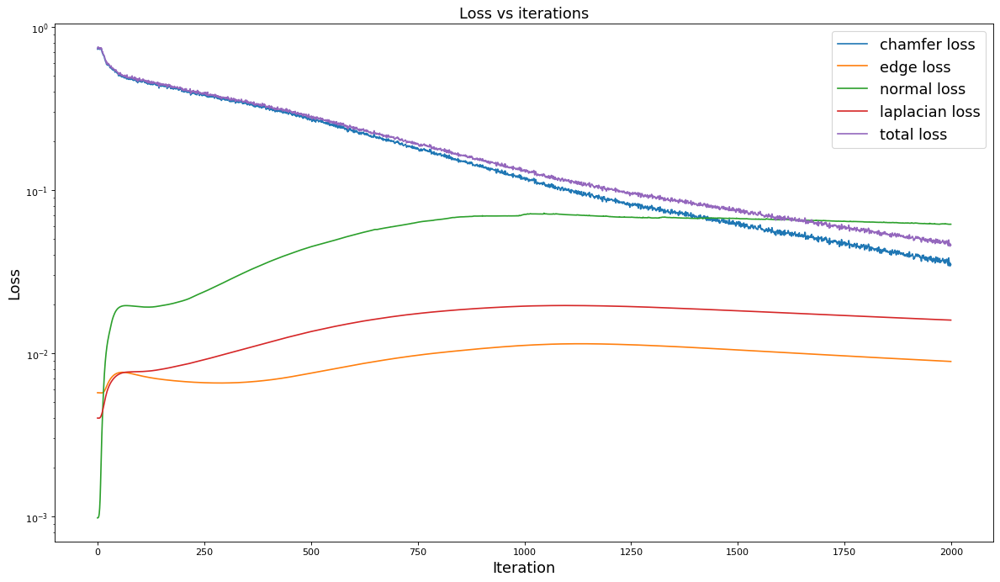

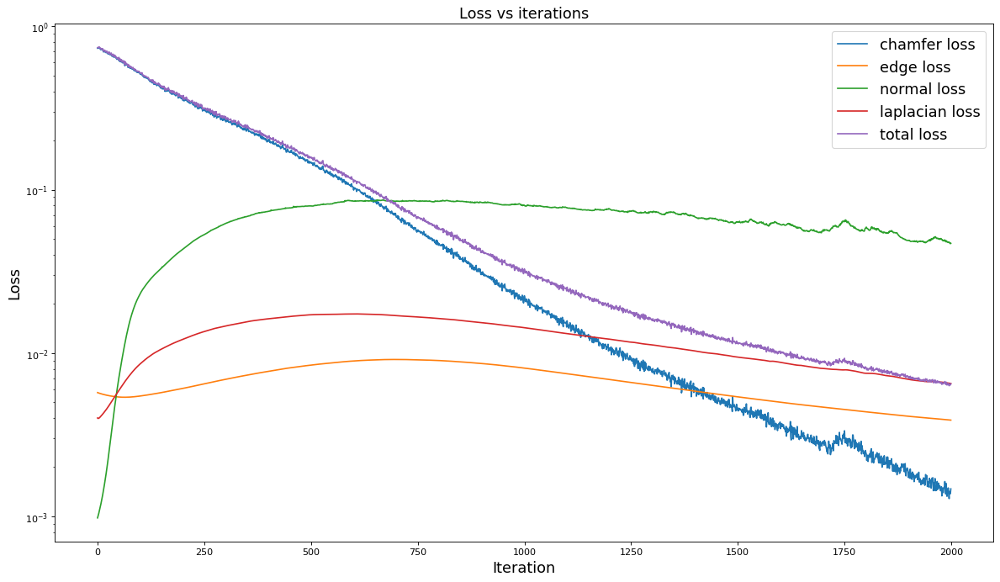

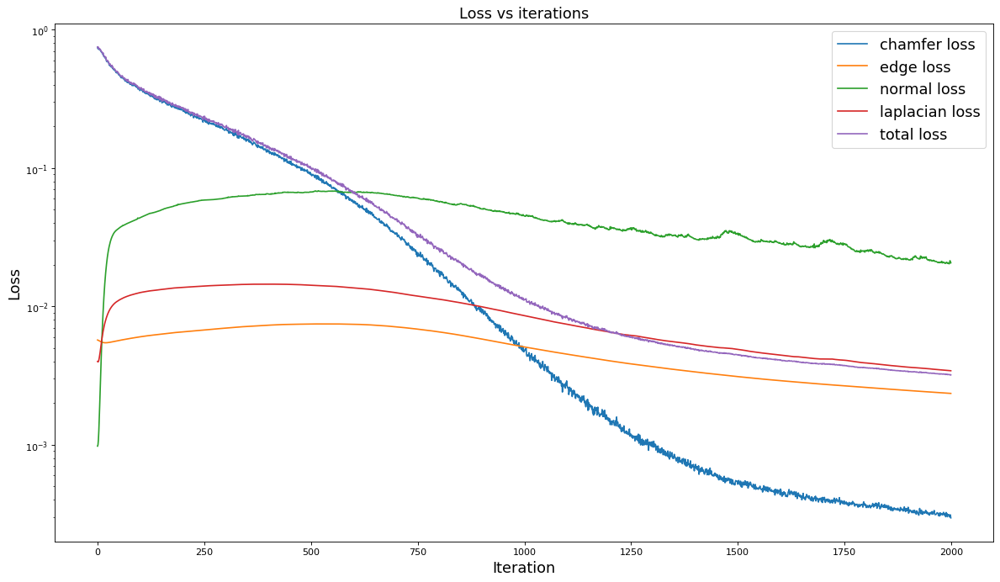

In [15]:
plot_losses_log(losses4,(18,10))
plot_losses_log(losses5,(18,10))
plot_losses_log(losses6,(18,10))

In [16]:
plotly_submeshes([[verts21,verts22,verts23]],[[faces21,faces22,faces23]],(1,3))

## Discussion for 2.5 part 2 (learning rate)

Above, to make sure the output mesh is not non-sense, we have tried different learning rates to for these 3 methods. We have shown 1 setting per method. 

The first pair, SGD, has the largest learning rate of 0.1. However, this learning rate is not enough for the mesh to converge to a dolphin shape. So, the SGD converges slowest. 

The second pair, Adam, has the learning rate of 0.001. The final mesh from this setting presents some detail of a dolphin. By observing the loss curve, the loss does not converge to its best situtation. And more iterations or better learning rate would improve the result. Compared to the first and the third method, the Adam converges in a moderate speed.

The third pair, RMSprop, has the smallest learning rate of 0.0001. It has the best reconstruction shape among these 3 methods. And its loss has converged below 10-3 scale which makes it lowest loss among these 3 experiment. We can conclude that RMSprop method has the fastest converging speed and the best loss, in 2000 iterations.

  0%|          | 0/2000 [00:00<?, ?it/s]

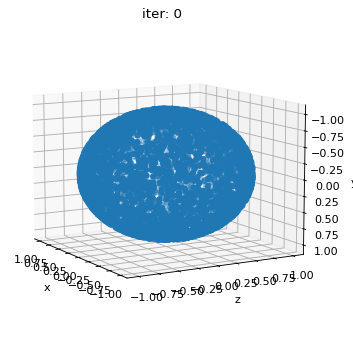

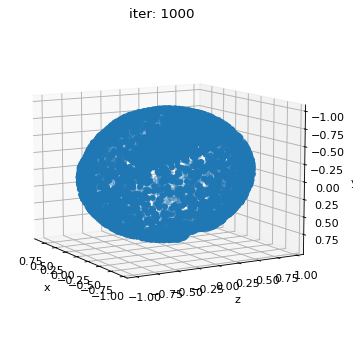

  0%|          | 0/2000 [00:00<?, ?it/s]

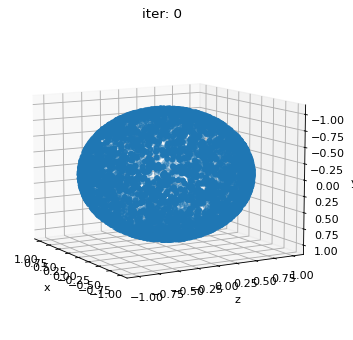

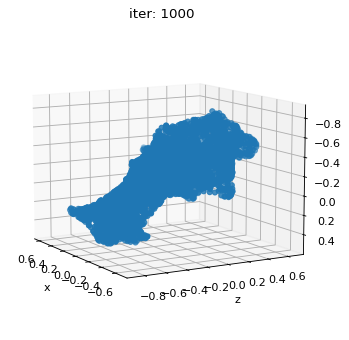

  0%|          | 0/2000 [00:00<?, ?it/s]

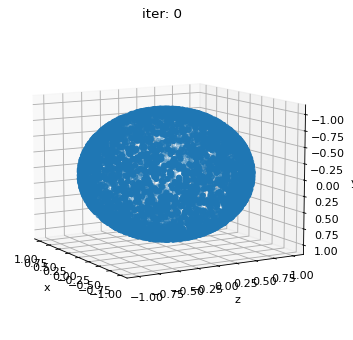

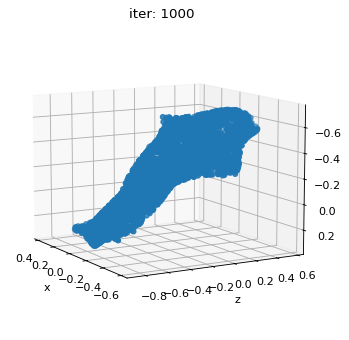

In [17]:
# code for 2.5 part 3 (momentum)
final_verts, final_faces,losses7=SGD_opt(src_mesh,trg_mesh,1.0,1.0,0.01,0.1,2000,0.1,0.5)
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts24 = final_verts_nback.detach().cpu()
faces24 = final_faces.cpu()

final_verts, final_faces,losses8=Adam_opt(src_mesh,trg_mesh,1.0,1.0,0.01,0.1,2000,0.001,(0.5,0.999))
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts25 = final_verts_nback.detach().cpu()
faces25 = final_faces.cpu()

final_verts, final_faces,losses9=RMSprop_opt(src_mesh,trg_mesh,1.0,1.0,0.01,0.1,2000,0.0005,0.5)
final_verts_nback = final_verts * largest_distance
#final_obj = os.path.join('./', 'final_model3.obj')
#save_obj(final_obj, final_verts_nback, final_faces)
verts26 = final_verts_nback.detach().cpu()
faces26 = final_faces.cpu()

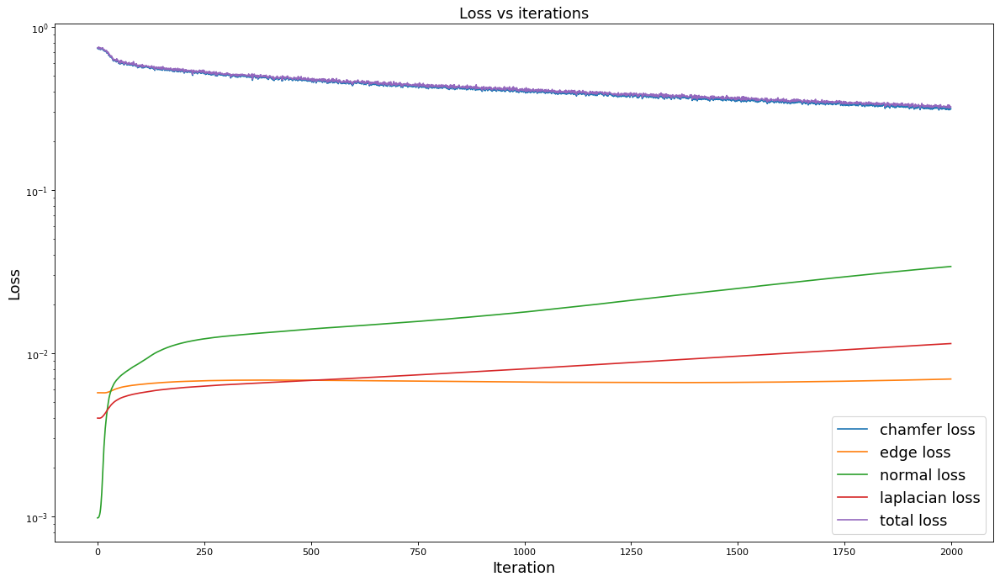

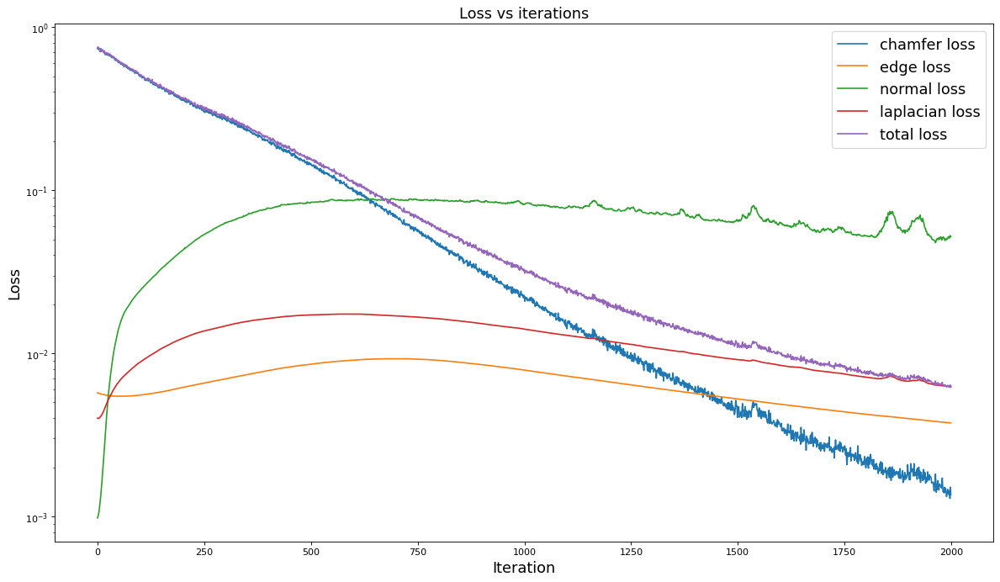

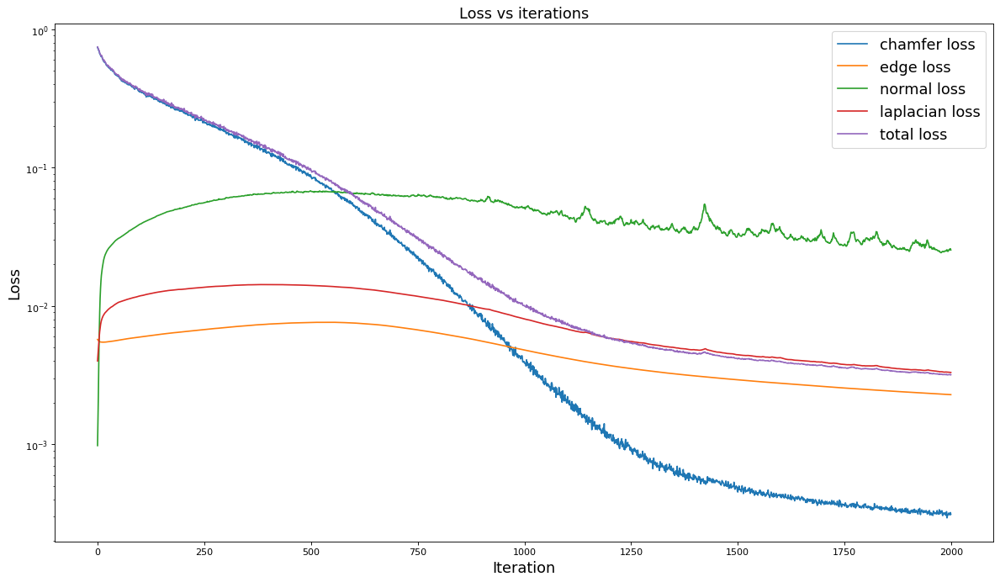

In [18]:
plot_losses_log(losses7,(18,10))
plot_losses_log(losses8,(18,10))
plot_losses_log(losses9,(18,10))

In [19]:
plotly_submeshes([[verts24,verts25,verts26]],[[faces24,faces25,faces26]],(1,3))

## Discussion for 2.5 part 3 (momentum)

In the above experiments, we tested these three methods with lower momentum. We understand that the lower the momentum, the more the optimization step is influenced by the current gradient. We expected that a lower global gradient (due to reduced momentum) would cause the loss to oscillate more during optimization and potentially result in getting stuck in local optima. However, this was never observed.